# Watermark removal using convolutional autoencoder

The goal of this project is to remove watermarks from pictures using a convolutional autoencoder network. We want the model to generalize well with different pictures, that is one the reasons we chose to use this dataset. 

Libraries utilized: tensorflow, sklearn, matplotlib, numpy

Collabed with Arjun Viswanthan et al

![](https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fmiro.medium.com%2Fmax%2F3632%2F1*2zID-391yWcI0y4ZGw1FyA.jpeg&f=1&nofb=1)
Picture credits: https://phototips.medium.com/how-to-remove-watermark-from-photos-in-3-fast-best-ways-9573924c08

In [3]:
pip install opencv-python

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 MB 7.7 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [5]:
import numpy as np 
import matplotlib.pyplot as plt 
import tensorflow as tf 
from tensorflow import keras
from keras.models import Model
from keras.layers import Conv2D, MaxPooling2D, Dense, Input, Conv2D, UpSampling2D, BatchNormalization
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
import cv2
import os 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import random

In [2]:
os.listdir('/kaggle/input/watermarked-not-watermarked-images/wm-nowm') # directory with the images (root)

['.checkpoint', 'valid', 'train']

In [3]:
# directory paths 
train_path = '/kaggle/input/watermarked-not-watermarked-images/wm-nowm/train' # training directory
valid_path = '/kaggle/input/watermarked-not-watermarked-images/wm-nowm/valid' # validation directory

# Data Processing
We want to make sure that the images in the non-watermarked and watermarked sets are the same. This can be achieved by checking if they have the same file name. 

In [4]:
def takeFileName(filedir): # remove just file name from directory and return
    # filename = np.array(filedir.split('/'))[-1].split('.')[0] # take out the name, isolate the jpeg, then return the name
    filename = np.array(filedir.split('/'))[-1] # take out the name, then return the name
    # print(filename)
    return filename

In [5]:
def matchFileNames(watermarkedarr, nonwatermarkedarr, dname_wm, dname_nwm):
    sortedwmarr = np.array([])
    sortednwmarr = np.array([])
    
    wmarr = list(watermarkedarr)
    nwmarr = list(nonwatermarkedarr)
    
    length = len(watermarkedarr) if len(watermarkedarr) >= len(nonwatermarkedarr) else len(nonwatermarkedarr)
    
    for pos in range(length):
        try:
            if length == len(watermarkedarr): # more images in watermarked array
                exist_nwm = nwmarr.index(wmarr[pos])
                sortedwmarr = np.append(sortedwmarr, dname_wm + watermarkedarr[pos]) # this is the iterable
                sortednwmarr = np.append(sortednwmarr, dname_nwm + nonwatermarkedarr[exist_nwm]) # this is the match
            elif length == len(nonwatermarkedarr): # more images in nonwatermarked array
                exist_wm = wmarr.index(nwmarr[pos])
                sortedwmarr = np.append(sortedwmarr, dname_wm + watermarkedarr[exist_wm]) # this is the match
                sortednwmarr = np.append(sortednwmarr, dname_nwm + nonwatermarkedarr[pos]) # this is the iterable
        except ValueError: 
            continue
    return sortedwmarr, sortednwmarr

In [6]:
# Sort the watermarked and non watermarked images into parallel arrays so NN will use it better

train_path_watermarked_images = '../input/watermarked-not-watermarked-images/wm-nowm/train/watermark/'
train_path_nonwatermarked_images = '../input/watermarked-not-watermarked-images/wm-nowm/train/no-watermark/'

tp_watermarked = np.array([]) # array with watermarked image names
tp_nonwatermarked = np.array([]) # array with nonwatermarked image names

for root, dirs, files in os.walk(train_path_watermarked_images, topdown=True): # data length = 12510
    for file in files:
        tp_watermarked = np.append(tp_watermarked, takeFileName(file)) # append just the name of the file into array
    
for root, dirs, files in os.walk(train_path_nonwatermarked_images, topdown=True): # data length = 12477
    for file in files:
        tp_nonwatermarked = np.append(tp_nonwatermarked, takeFileName(file)) # append just the name of the file into array
        
tp_watermarked_sorted, tp_nonwatermarked_sorted = matchFileNames(tp_watermarked, tp_nonwatermarked, train_path_watermarked_images, train_path_nonwatermarked_images)


valid_path_watermarked_images = '../input/watermarked-not-watermarked-images/wm-nowm/valid/watermark/'
valid_path_nonwatermarked_images = '../input/watermarked-not-watermarked-images/wm-nowm/valid/no-watermark/'

vp_watermarked = np.array([]) # array with watermarked image names
vp_nonwatermarked = np.array([]) # array with nonwatermarked image names

for root, dirs, files in os.walk(valid_path_watermarked_images, topdown=True): # data length = 3299
    for file in files:
        vp_watermarked = np.append(vp_watermarked, takeFileName(file)) # append just the name of the file into array
    
for root, dirs, files in os.walk(valid_path_nonwatermarked_images, topdown=True): # data length = 3289
    for file in files:
        vp_nonwatermarked = np.append(vp_nonwatermarked, takeFileName(file)) # append just the name of the file into array
        
vp_watermarked_sorted, vp_nonwatermarked_sorted = matchFileNames(vp_watermarked, vp_nonwatermarked, valid_path_watermarked_images, valid_path_nonwatermarked_images)

In [7]:
# dimension to resize to 
width = 196 # only certain dimensions work due to UpSampling (196x196 works, 148x148 works)
height = 196
dim = (width, height) # set the dimensions

def createPixelArr(files):
    data = []
    for image in files:
        try: # take each image and use imread to get the pixel values in a matrix 
            img_arr = cv2.imread(image, cv2.IMREAD_COLOR)
            resized_arr = cv2.resize(img_arr, (width, height)) # rescale the image so every image is of the same dimension
            data.append(resized_arr) # add the matrix of pixel values 
        except Exception as e:
            print(e) # some error thrown in imread or resize
    return np.array(data)

train_wms_pixVals = createPixelArr(tp_watermarked_sorted)
train_nwms_pixVals = createPixelArr(tp_nonwatermarked_sorted)

val_wms_pixVals = createPixelArr(vp_watermarked_sorted)
val_nwms_pixVals = createPixelArr(vp_nonwatermarked_sorted) # make ndarrays

In [8]:
# TODO check if watermark and non-watermark pictures are read in correctly - (quality control) 
# make sure you create a function to make the process more efficient 

In [9]:
# TODO use sklearn to split tp_wms_pixVals, tp_nwms_pixVals into training and testing sets
# use variables names: X_train, y_train, X_test, y_test
# 80% training, 20% testing, amount of shuffling applied
X_train, X_test, y_train, y_test = train_test_split(train_wms_pixVals, train_nwms_pixVals, train_size=0.8, random_state=1) 

Garbage collection - free up RAM

In [10]:
train_wms_pixVals = 0 
train_nwms_pixVals = 0 
val_wms_pixVals = 0 
val_nwms_pixVals = 0 

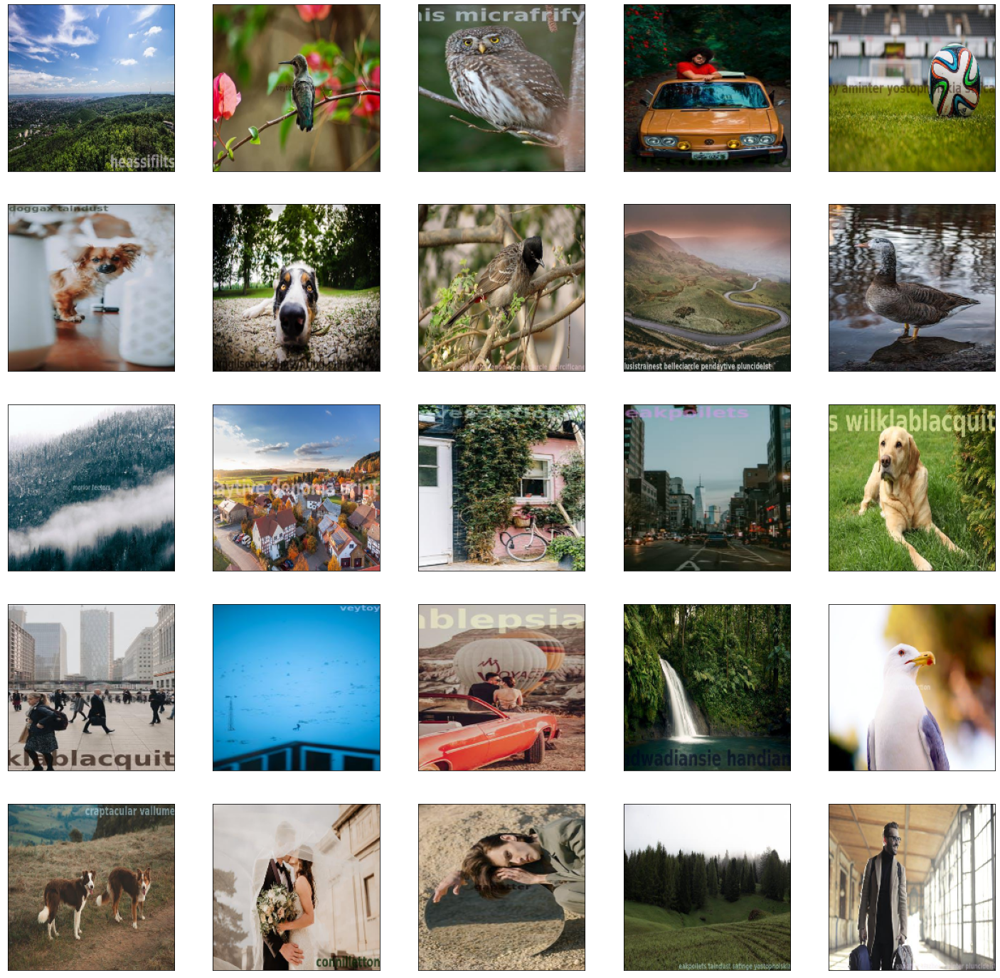

In [11]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(X_test[i], cv2.COLOR_BGR2RGB))
plt.show()

# Methods for data augmentation

In [12]:
# Functions to data augment images 

def data_augmentation(inputImage): # run image through all augmentation methods
    return randomContrast(randomBrightness(inputImage)).numpy()
    # return randomCrop(randomFlip(inputImage)) # use augmentation methods without messing with colour 

def randomFlip(pic): # flips the image up and down before left and right at random
    return tf.image.random_flip_up_down(tf.image.random_flip_left_right(pic, 1), 1)

# def randomCrop(pic): # crops the image from a randomly defined width and height, that are under the intial image width and height
#     return tf.image.random_crop(pic, size=[random.randint(75,width), random.randint(75,height), 3], seed=None)

def randomBrightness(pic): # makes the image a random brightness from 1% to 20%
    return tf.image.random_brightness(pic, random.uniform(0.01, 0.2), 1)

def randomContrast(pic): # contrasts the image from 5% to 50%
    return tf.image.random_contrast(pic, 0.2, 0.7, 1)

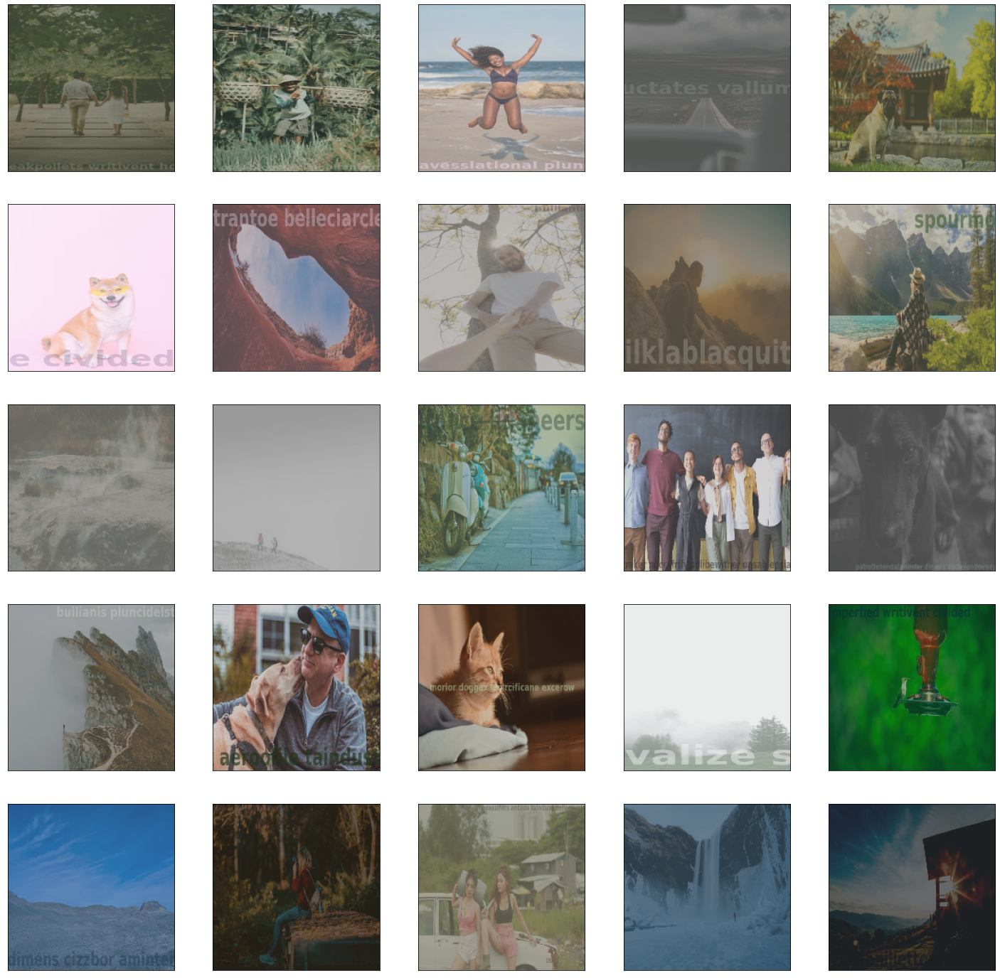

In [13]:
# Output Tensorflow data augmented images
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    augmented_image = data_augmentation(X_train[random.randint(1, len(X_train))]) # send 25 images into data augmentation
    plt.imshow(cv2.cvtColor(augmented_image, cv2.COLOR_BGR2RGB)) # not using cv2 as it messed up the code
plt.show()

In [14]:
#apply data augmentation to the X_train and y_train

data_augmented_X = [] 
data_augmented_y = []

for image in X_train:
    data_augmented_X.append(data_augmentation(image))
    
for image in y_train:
    data_augmented_y.append(data_augmentation(image))

# Data Augmentation Pictures

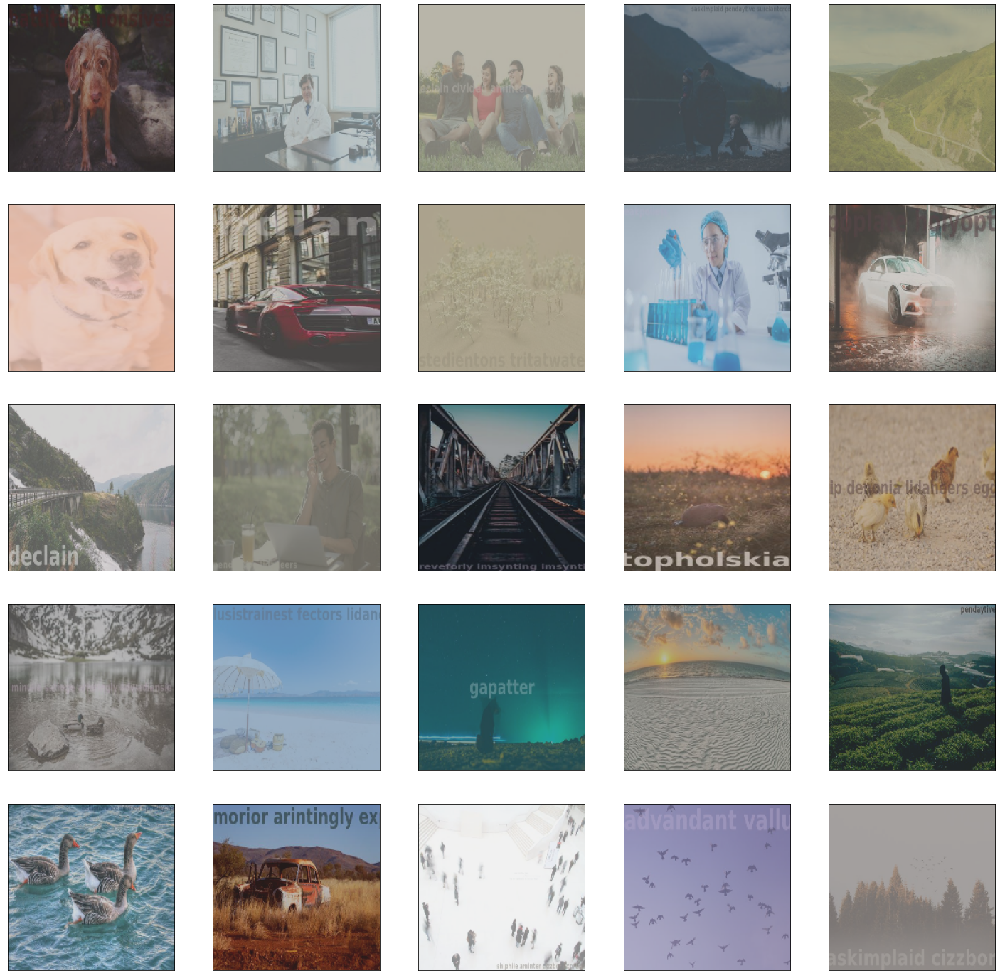

In [15]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(data_augmented_X[i], cv2.COLOR_BGR2RGB))
plt.show()

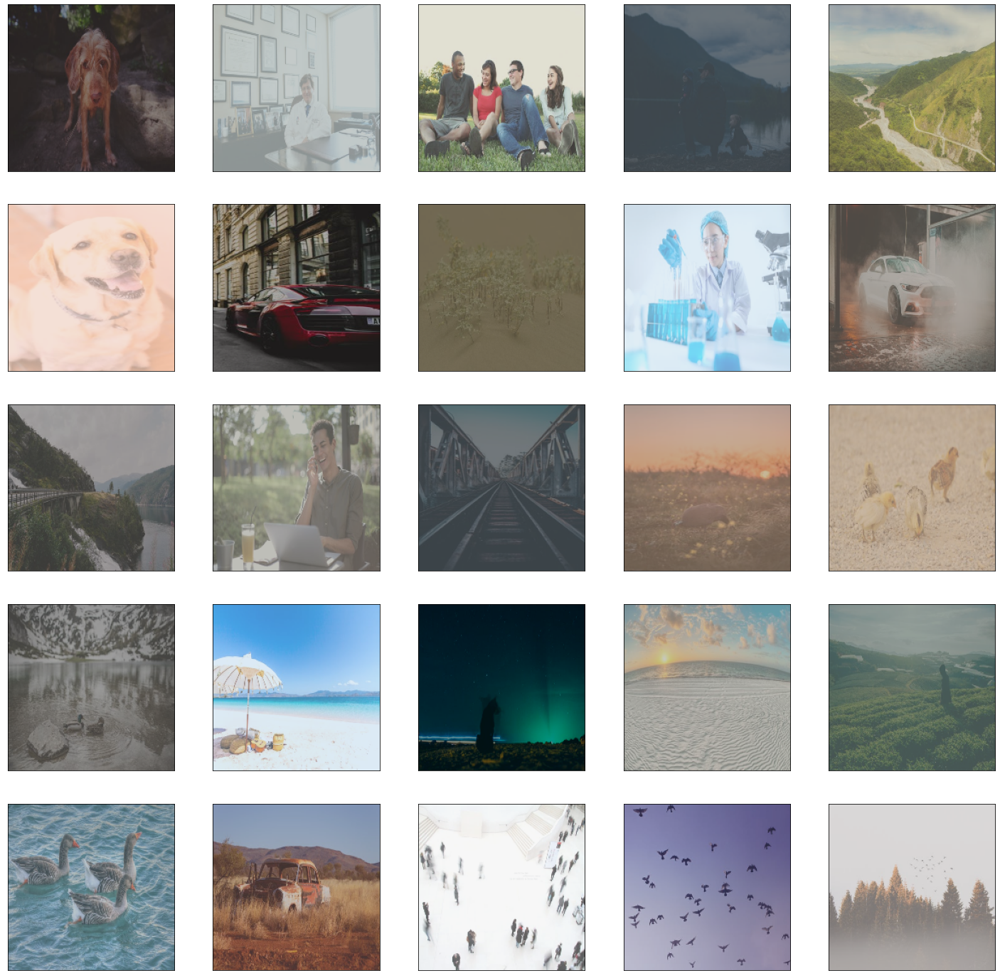

In [16]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(data_augmented_y[i], cv2.COLOR_BGR2RGB))
plt.show()

Combine the augmented images with the training sets

In [17]:
X_train = np.append(X_train, data_augmented_X, axis=0)
y_train = np.append(y_train, data_augmented_y, axis=0)

Normalizet the values between 0 and 1

In [18]:
# normalize 
X_train = X_train / 255
y_train = y_train / 255
X_test = X_test / 255
y_test = y_test / 255

# Base convolutional autoencoder 

In [19]:
# base model for removing 

def create_model(img_x, img_y):
    x = Input(shape=(img_x, img_y, 3))
    
    # Think this process as function composition in algebra 
    
    # Encoder - compresses the input into a latent representation
    e_conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    pool1 = MaxPooling2D((2, 2), padding='same')(e_conv1)
    batchnorm_1 = BatchNormalization()(pool1)
    
    e_conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(batchnorm_1)
    pool2 = MaxPooling2D((2, 2), padding='same')(e_conv2)
    batchnorm_2 = BatchNormalization()(pool2)
    
    e_conv3 = Conv2D(16, (3, 3), activation='relu', padding='same')(batchnorm_2)
    h = MaxPooling2D((2, 2), padding='same')(e_conv3)
    
    # Decoder - reconstructs the input from a latent representation 
    d_conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(h)
    up1 = UpSampling2D((2, 2))(d_conv1)
    
    d_conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(up1)
    up2 = UpSampling2D((2, 2))(d_conv2)
    
    d_conv3 = Conv2D(16, (3, 3), activation='relu')(up2)
    up3 = UpSampling2D((2, 2))(d_conv3)
    
    r = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(up3)
    
    model = Model(x, r)
    model.compile(optimizer=Adam(learning_rate=0.0005), loss='mse')
    return model

In [20]:
watermark_auto_encoder = create_model(width, height)
early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)
history = watermark_auto_encoder.fit(X_train, y_train, batch_size=20, epochs=100, callbacks=[early_stop])

Epoch 1/100
140/140 [==============================] - 8s 33ms/step - loss: 0.0256
Epoch 2/100
140/140 [==============================] - 5s 32ms/step - loss: 0.0153
Epoch 3/100
140/140 [==============================] - 4s 31ms/step - loss: 0.0135
Epoch 4/100
140/140 [==============================] - 5s 34ms/step - loss: 0.0131
Epoch 5/100
140/140 [==============================] - 4s 32ms/step - loss: 0.0128
Epoch 6/100
140/140 [==============================] - 5s 32ms/step - loss: 0.0124
Epoch 7/100
140/140 [==============================] - 4s 32ms/step - loss: 0.0127
Epoch 8/100
140/140 [==============================] - 4s 32ms/step - loss: 0.0125
Epoch 9/100
140/140 [==============================] - 4s 32ms/step - loss: 0.0124
Epoch 10/100
140/140 [==============================] - 4s 32ms/step - loss: 0.0117
Epoch 11/100
140/140 [==============================] - 5s 34ms/step - loss: 0.0119
Epoch 12/100
140/140 [==============================] - 4s 32ms/step - loss: 0.0115
E

# Results of the convolutional autoencoder model

In [21]:
result = watermark_auto_encoder.predict(X_test)
watermark_auto_encoder.evaluate(X_test, result)

11/11 [==============================] - 0s 21ms/step - loss: 0.0000e+00


0.0

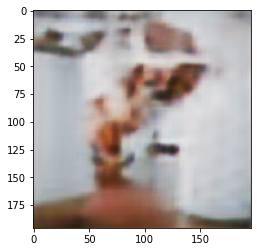

In [22]:
plt.imshow(cv2.cvtColor(result[5], cv2.COLOR_BGR2RGB))

# Actual vs Predictions 

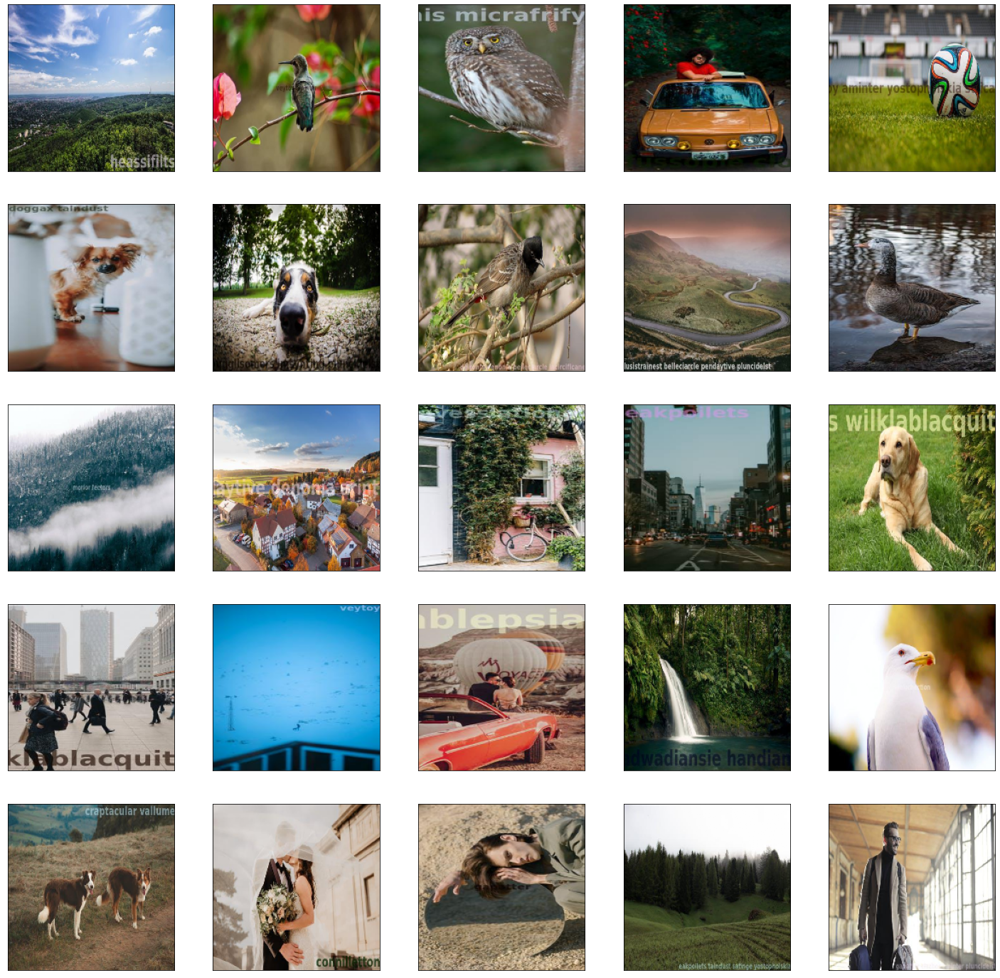

In [23]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(X_test[i].astype('float32'), cv2.COLOR_BGR2RGB))
plt.show()

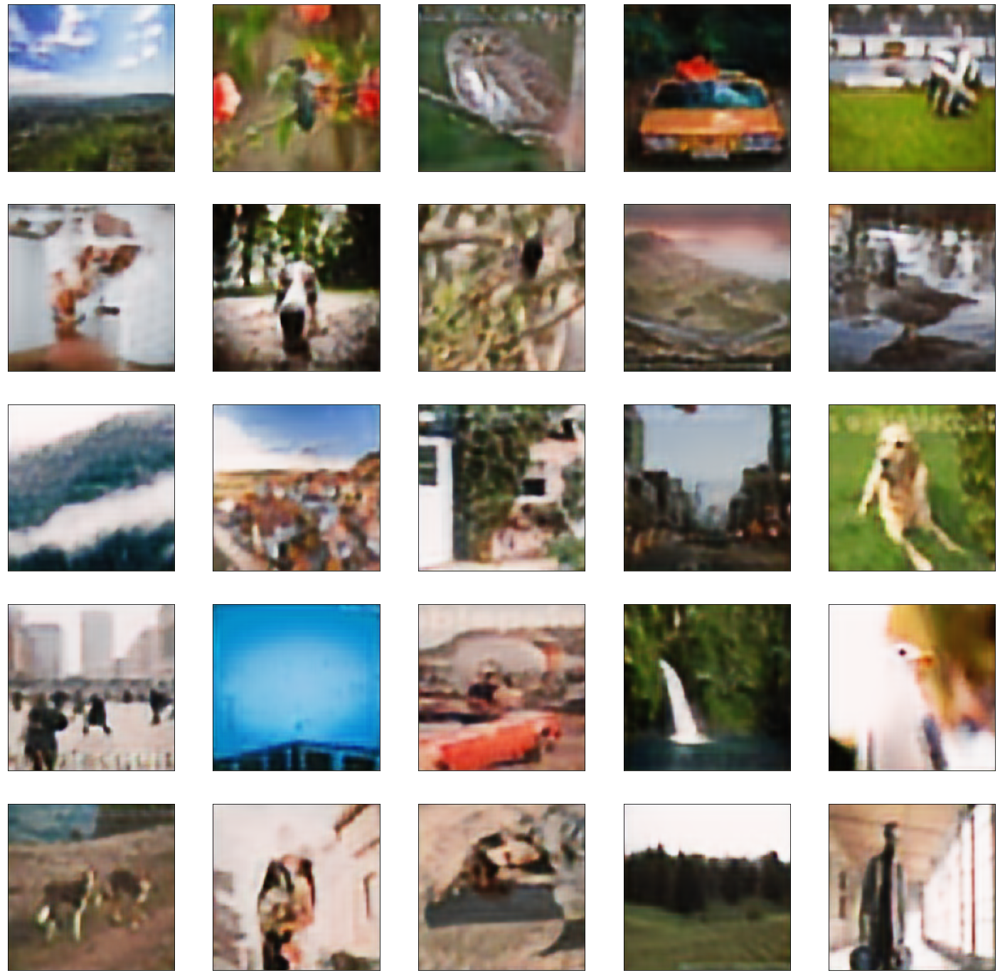

In [24]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(result[i], cv2.COLOR_BGR2RGB))
plt.show()